# Рассчет

In [36]:
import numpy as np
import sympy as sp
from sympy import symbols
from sympy.functions import exp

def cartesian(u, V, c, a, b, x, tau, tsteps, h):
    dV = sp.diff(V, R)
    d2V = sp.diff(dV, R)
    d2u = np.zeros(len(x))
    
    for i in range(len(x)):
        if ((x[i] > a) and (x[i] < b)):
            d2u[i] = c**2 * d2V.subs({R:x[i], A:a, B:b})
        
    u[1, :] = u[0, :] + (tau ** 2) * d2u / 2
    u[1, 0] = u[1, 1]
    u[1, len(x) - 1] = u[1, len(x) - 2]

    for t in range(2, tsteps):
        for r in range(1, len(x) - 2):
            u[t, r] = (2*u[t-1, r] - u[t-2, r] + (tau*c)**2/(h**2) * 
                       (u[t-1, r+1] - 2 * u[t-1, r] + u[t-1, r-1]))
        u[t, 0] = u[t, 1]
        u[t, len(x) - 1] = u[t, len(x) - 2]
        
    return u

def cylindrical(u, V, c, a, b, x, tau, tsteps, h, R):
    dV = sp.diff(V, R)
    d2u = np.zeros(len(x))
    drdV = sp.diff(dV*R, R)
    
    for i in range(len(x)):
        if ((x[i] > a) and (x[i] < b)):
            d2u[i] = c**2 * drdV.subs({R:x[i], A:a, B:b}) / x[i]
    
    u[1, :] = u[0, :] + (tau ** 2) * d2u / 2
    u[1, 0] = u[1, 1]
    u[1, len(x) - 1] = u[1, len(x) - 2]
    
    for t in range(2, tsteps):
        for r in range(1, len(x) - 2):
            u[t, r] = (2*u[t-1, r] - u[t-2, r] + (tau*c)**2/(h**2)/x[r] * 
                      ((x[r] + h/2) * (u[t-1, r+1] - u[t-1, r]) -
                       (x[r] - h/2) * (u[t-1, r] - u[t-1, r-1])))
        u[t, 0] = u[t, 1]
        u[t, len(x) - 1] = u[t, len(x) - 2]
        
    return u

def spherical(u, V, c, a, b, x, tau, tsteps, h, R):
    dV = sp.diff(V, R)
    d2u = np.zeros(len(x))
    drdV = sp.diff(dV*R*R, R)
    
    for i in range(len(x)):
        if ((x[i] > a) and (x[i] < b)):
            d2u[i] = c**2 * drdV.subs({R:x[i], A:a, B:b}) / x[i] / x[i]
    
    u[1, :] = u[0, :] + (tau ** 2) * d2u / 2
    u[1, 0] = u[1, 1]
    u[1, len(x) - 1] = u[1, len(x) - 2]
    
    for t in range(2, tsteps):
        for r in range(1, len(x) - 2):
            u[t, r] = (2*u[t-1, r] - u[t-2, r] + (tau*c)**2/(h**2)/x[r]/x[r] * 
                      (((x[r] + h/2)**2) * (u[t-1, r+1] - u[t-1, r]) -
                       ((x[r] - h/2)**2) * (u[t-1, r] - u[t-1, r-1])))
        u[t, 0] = u[t, 1]
        u[t, len(x) - 1] = u[t, len(x) - 2]
        
    return u

rmin = 0
rmax = 1.8
c = 1.5
a = 0.6
b = 1.2
f = 0
I = 100
T = 3
h = (rmax - rmin)/I
courant = 0.8
tau = courant * h / c
tsteps = int(T / tau)

R, A, B = symbols("r a b")
V = exp((-4 * (2 * R - (A + B))**2)/((B - A)**2 - (2 * R - (A + B))**2))

x = np.array([rmin + (i - 0.5) * h for i in range(0, I + 1)])
u = np.zeros((tsteps, len(x)))

for i in range(len(x)):
    if ((x[i] > a) and (x[i] < b)):
        u[0, i] = V.subs({R:x[i], A:a, B:b})
    
u1 = np.copy(u)
u1 = cartesian(u1, V, c, a, b, x, tau, tsteps, h)

u2 = np.copy(u)
u2 = cylindrical(u2, V, c, a, b, x, tau, tsteps, h, R)

u3 = np.copy(u)
u3 = spherical(u3, V, c, a, b, x, tau, tsteps, h, R)


# Анимация R1

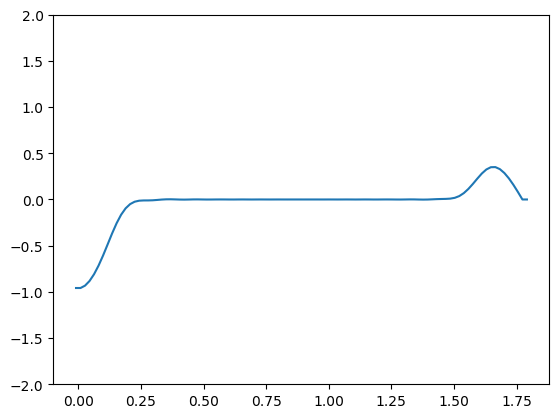

In [37]:
%matplotlib inline
import matplotlib.animation as animation
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"

fig, ax = plt.subplots()
pl, = ax.plot(x, u1[0])
ax.set_ylim(-2, 2)
X = x

def update(frame, X, u):
    x = X
    y = u[frame]
    pl.set_data(x, y)
    return(pl)
    
ani = animation.FuncAnimation(fig, update, frames=tsteps, interval=30, fargs=[X, u1])
ani

# Анимация R2

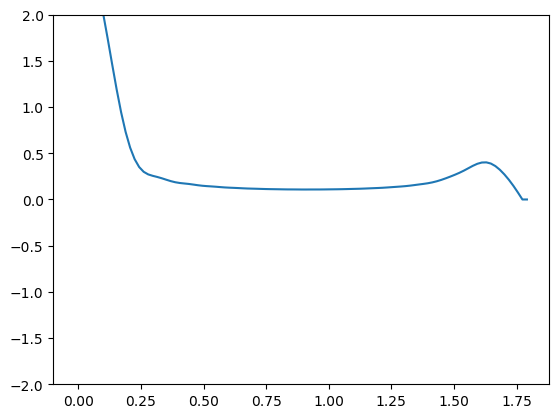

In [38]:
%matplotlib inline
import matplotlib.animation as animation
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"

fig, ax = plt.subplots()
pl, = ax.plot(x, u2[0])
ax.set_ylim(-2, 2)
X = x

def update(frame, X, u):
    x = X
    y = u[frame]
    pl.set_data(x, y)
    return(pl)
    
ani = animation.FuncAnimation(fig, update, frames=tsteps, interval=30, fargs=[X, u2])
ani

# Анимация R3

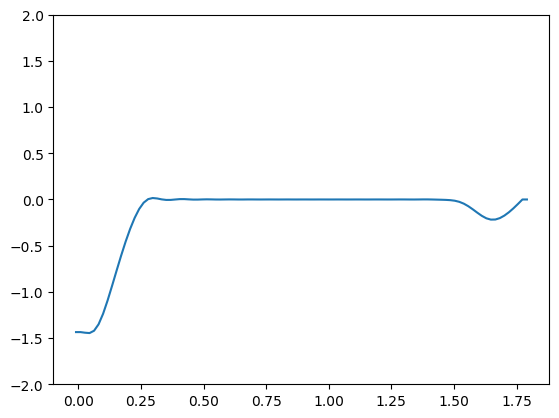

In [39]:
%matplotlib inline
import matplotlib.animation as animation
import matplotlib.pyplot as plt
plt.rcParams["animation.html"] = "jshtml"

fig, ax = plt.subplots()
pl, = ax.plot(x, u3[0])
ax.set_ylim(-2, 2) 
X = x

def update(frame, X, u):
    x = X
    y = u[frame]
    pl.set_data(x, y)
    return(pl)
    
ani = animation.FuncAnimation(fig, update, frames=tsteps, interval=30, fargs=[X, u3])
ani